In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os, glob, re
import sklearn
%matplotlib inline  

# Get Data

In [2]:
snid_dir = './allSNIDtemp/'
os.chdir('./allSNIDtemp/')
all_spec = glob.glob('*.lnw')
os.chdir('..')

In [138]:
# Get List of spectra files that are type Ib or Ic

# For some reason, these files do not have a standard organization, which makes it
# stupidly aggravating to load them all. Here we search for spectra of type Ib or Ic
# and find the line number where the wavelength 2501.69 appears (this is the first).
Ib_Ic = []
Ib_Ic_names = []
skiprows = []
SN_type_vec = []
for spec_name in all_spec:
    path = snid_dir + spec_name
    with open(path, 'r') as f:
        lines = f.readlines()
        header = lines[0].split()
        SN_type = int(header[-2])
        if ((SN_type == 2) or (SN_type == 3)): 
            Ib_Ic.append(path)
            Ib_Ic_names.append(spec_name)
            SN_type_vec.append(SN_type)
            #the first observed wavelength is always 2501.69
            first_wvl = '2501.69'
            for i in range(len(lines)-1):
                line = lines[i]
                if first_wvl in line:
                    skiprows.append(i)
                    break

In [139]:
print "There are %d type Ib and Ic SN"%(len(Ib_Ic))

There are 153 type Ib and Ic SN


In [140]:
# For each spectra, skip all the header lines about removing continuum and load the phase=0
# spectra into a numpy array. Do some data processing like filtering for desired wavelengths and 
# normalizing data.

min_wavelength = 4000
max_wavelength = 7000

spectra = []
for i in range(len(Ib_Ic)-1):
    spec = Ib_Ic[i]
    skiprow = skiprows[i]
    s = np.loadtxt(spec,skiprows=skiprow, usecols=(0,1))
    
    # check that first wvl is 2501.69
    if not(s[0][0] == 2501.69): print 'first wavelength is not 2501.69'
    
    # filter for desired wavelengths
    mask = np.logical_and(s[:,0]>min_wavelength, s[:,0]<max_wavelength)
    s = s[mask]
    spectra.append(s)
    
SN_type_vec = np.array(SN_type_vec)

In [141]:
# Organize spectra in an (N x M) array, where N is the number of spectra, and M is the dimensionality
# (ie number of data points in spectrum) of a spectrum. We treat each wavelength as independent
# and zero the means and unify the standard deviations.

wavelengths = np.array(spectra[0][:,0])
spectra_matrix = np.ndarray((len(spectra),spectra[0].shape[0]))
for i, spec in enumerate(spectra):
    spectra_matrix[i,:] = spec[:,1]
    
#spectra_mean = np.mean(spectra_matrix, axis=1)
#spectra_std = np.std(spectra_matrix, axis=1)



In [142]:
# replace 0 values with NaN's

for i in range(spectra_matrix.shape[0]):
    spectra_matrix[i][spectra_matrix[i]==0] = np.nan

In [143]:
spectra_mean = np.nanmean(spectra_matrix, axis=1)
spectra_std = np.nanstd(spectra_matrix, axis=1)
original_spectra = np.copy(spectra_matrix)
spectra_matrixT = (spectra_matrix.T - spectra_mean)/spectra_std
spectra_matrix = spectra_matrixT.T

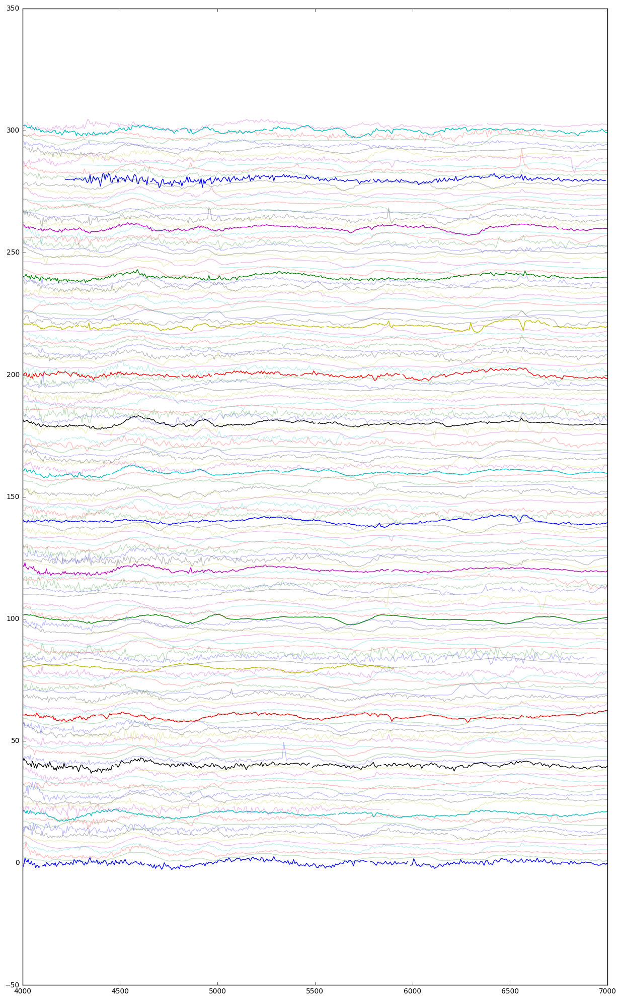

In [144]:
plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

# Data Cleaning

## Test spectrum interpolation

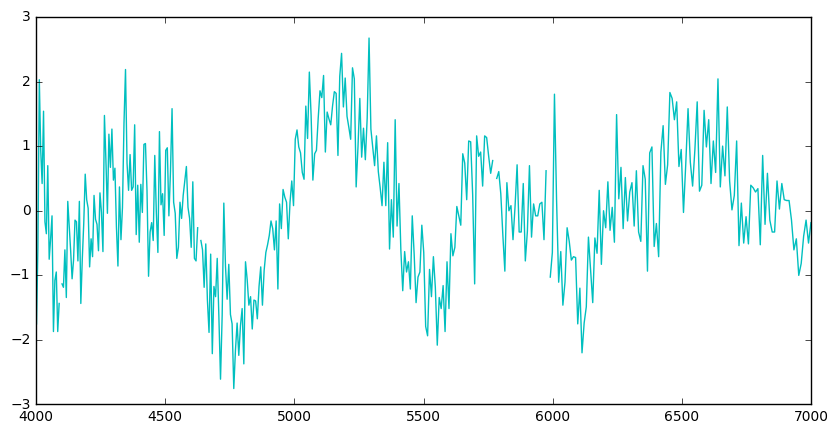

In [145]:
test_spec = spectra_matrix[0]
plt.figure(figsize=(10,5))
plt.plot(wavelengths,test_spec,'c')

In [146]:
from scipy.interpolate import interp1d

In [147]:
good_values = np.isfinite(test_spec)
interp_fn = interp1d(wavelengths[good_values],test_spec[good_values])

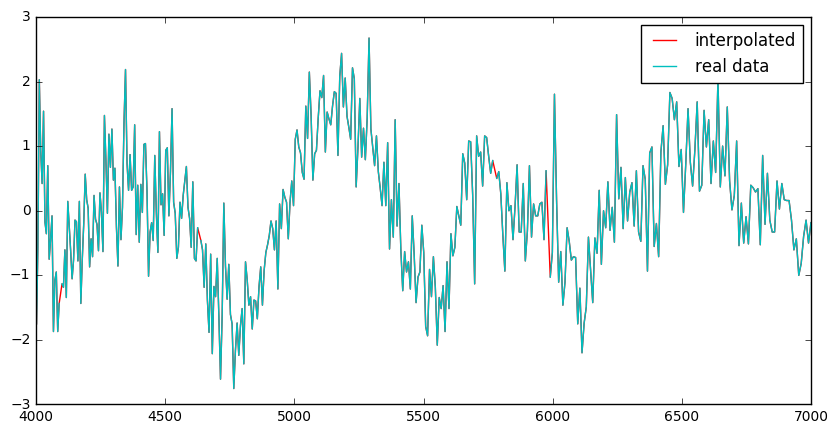

In [148]:
plt.figure(figsize=(10,5))
p1 = plt.plot(wavelengths,interp_fn(wavelengths),'r',label="interpolated")
p2 = plt.plot(wavelengths,test_spec,'c',label="real data")
plt.legend()

## Re-bin (lower resolution b/c don't care about noise)

In [149]:
print spectra_matrix.shape
print wavelengths.shape

(152, 414)
(414,)


In [150]:
nrows, ncols = spectra_matrix.shape
smoothing = 3 # Width of bins in terms of number of wavelength steps
tmp = np.reshape(spectra_matrix,(nrows, ncols/smoothing, smoothing))

In [151]:
spectra_matrix = np.nanmean(tmp, axis=2)

In [152]:
spectra_matrix.shape

(152, 138)

In [153]:
wvrows = wavelengths.shape[0]
wvcols = 1
wvtemp = np.reshape(wavelengths, (wvrows/smoothing,1,smoothing))
print wvtemp.shape
wavelengths = np.nanmean(wvtemp, axis=2)

(138, 1, 3)


In [154]:
wavelengths.shape

(138, 1)

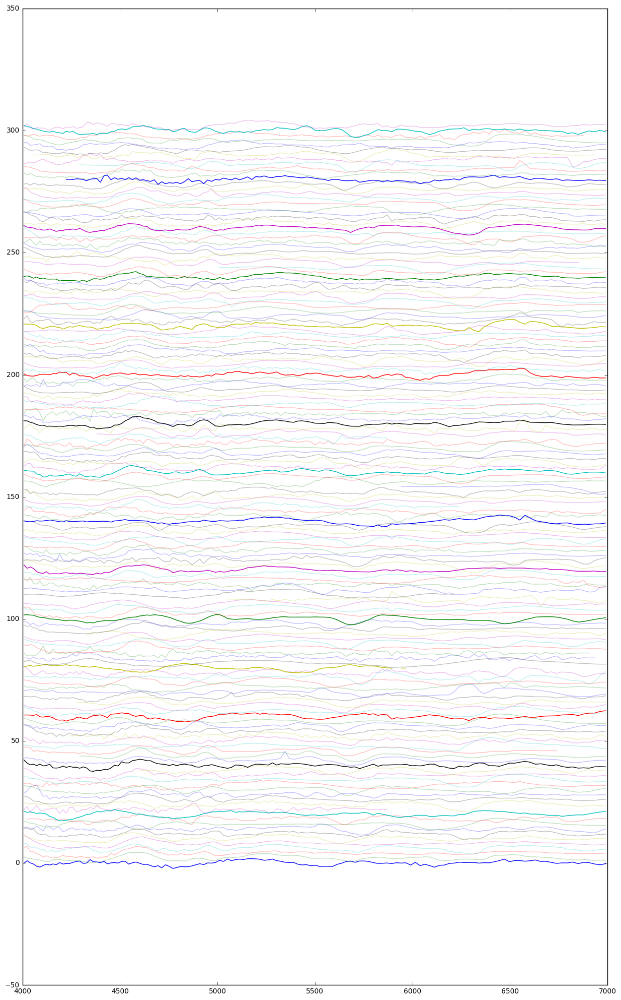

In [155]:
# Plot the spectra post data processing

plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

In [156]:
big_gap_mask = np.array([np.isnan(spec).any() for spec in spectra_matrix])
print 'total number of bad spectra = %d'%(np.sum(big_gap_mask))

total number of bad spectra = 23


In [157]:
spectra_matrix = spectra_matrix[np.invert(big_gap_mask)]

In [158]:
print spectra_matrix.shape

(129, 138)


## PCA Decomposition

In [159]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import Imputer


#imp = Imputer(missing_values='NaN', strategy='mean', axis=1, verbose=0, copy=True)


In [160]:
#spectra_matrix = imp.fit_transform(spectra_matrix)

In [161]:
spectra_matrix.shape

(129, 138)

In [162]:
spectra_matrix

array([[-0.09730364,  0.96526153,  0.05637314, ..., -0.39587567,
        -0.73835535, -0.27732501],
       [ 0.47659841,  0.03875657, -0.19700442, ..., -0.95817563,
        -0.809983  , -1.16025648],
       [ 2.1042087 ,  2.97168972,  0.62169719, ..., -0.10176843,
        -0.10007413,  0.02360969],
       ..., 
       [ 2.20383619,  1.88133756,  1.46943338, ..., -0.94770978,
        -1.05627367, -0.97644728],
       [ 2.14320316,  1.59798424,  1.46680375, ..., -0.47220788,
         0.14270068, -0.53369873],
       [-0.39319345,  0.87389526, -0.74034105, ...,  0.478147  ,
         0.49897586,  0.51286176]])

In [163]:
pca = PCA()

In [164]:
pca.fit(spectra_matrix)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [165]:
pca.components_

array([[-0.12507249, -0.09320055, -0.08308744, ..., -0.00722621,
        -0.02648672, -0.0251858 ],
       [ 0.05158205,  0.10217097,  0.136519  , ..., -0.0442926 ,
        -0.02543855, -0.00624024],
       [ 0.06333286,  0.04729535,  0.0190118 , ..., -0.02717882,
        -0.03857362, -0.03902778],
       ..., 
       [-0.00624408,  0.00620715, -0.00032804, ..., -0.07140114,
        -0.04457907,  0.07942885],
       [-0.02044986,  0.0600122 , -0.03681174, ..., -0.16712486,
         0.19579805, -0.10507915],
       [ 0.05589256, -0.02208639,  0.04534562, ..., -0.04125297,
        -0.05677504,  0.07717474]])

In [166]:
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

n_evecs = evecs.shape[0]
n_feat = evecs.shape[1]

In [167]:
print evecs.shape
print evals.shape

(129, 138)
(129,)


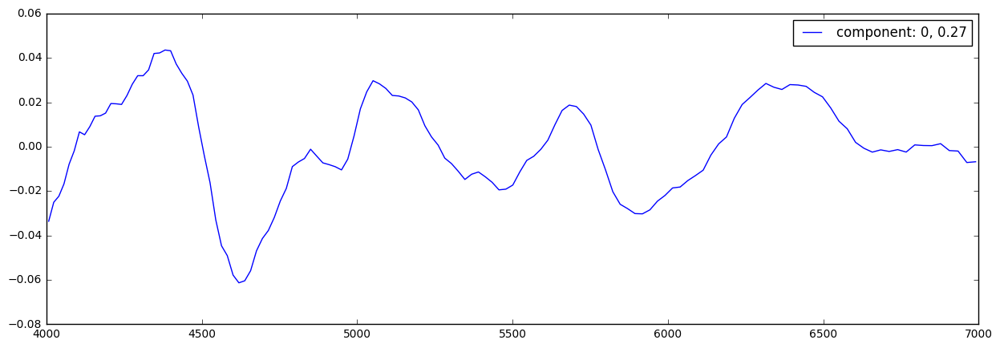

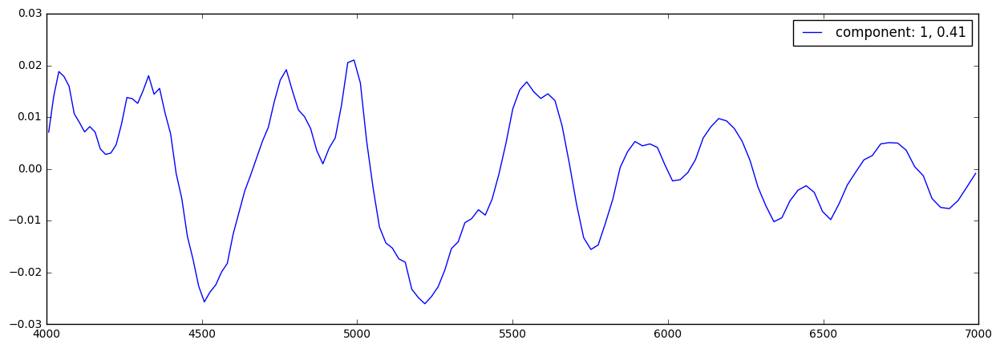

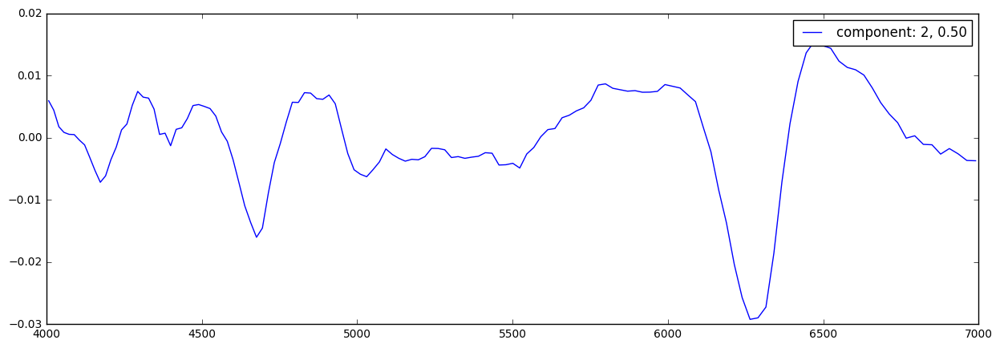

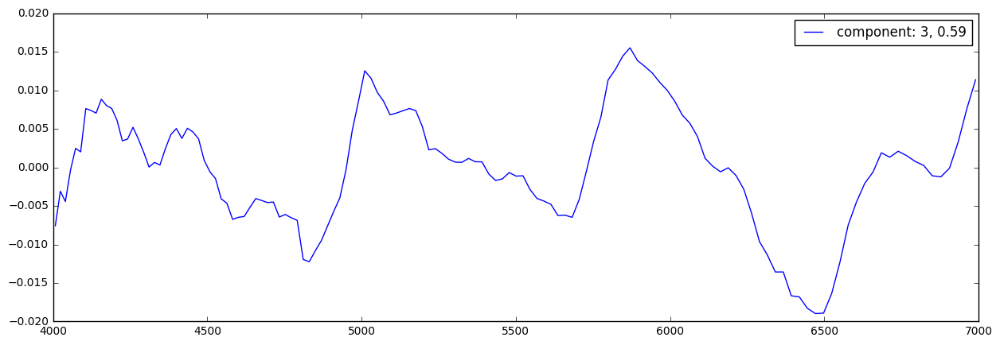

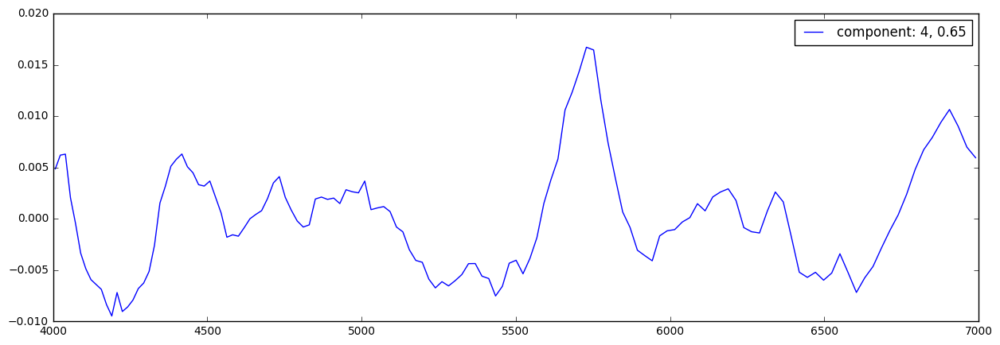

...

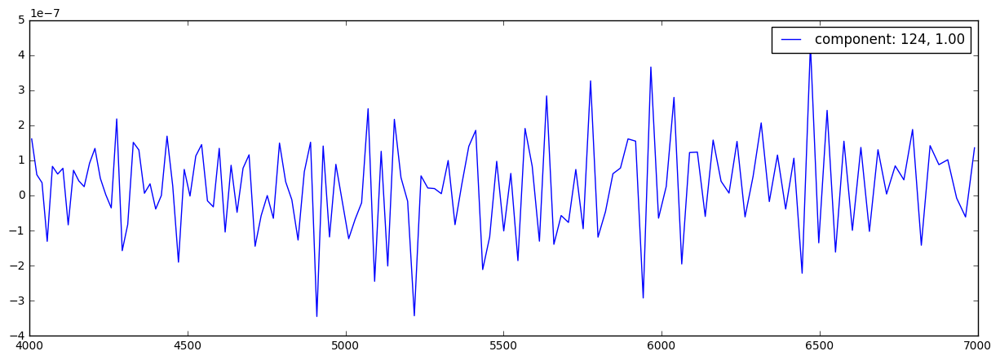

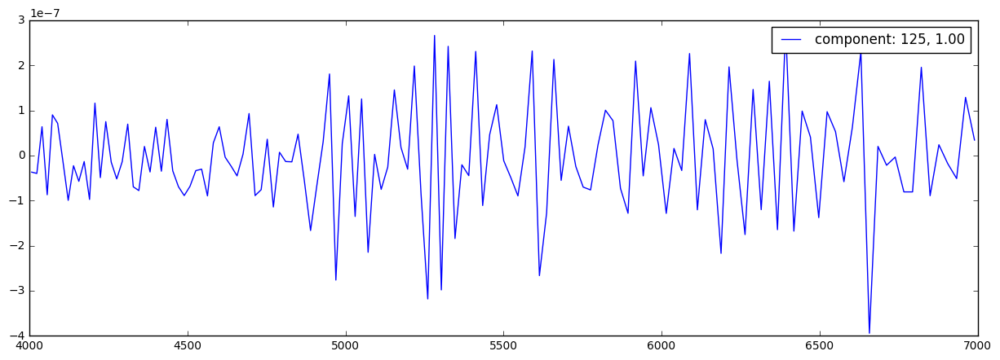

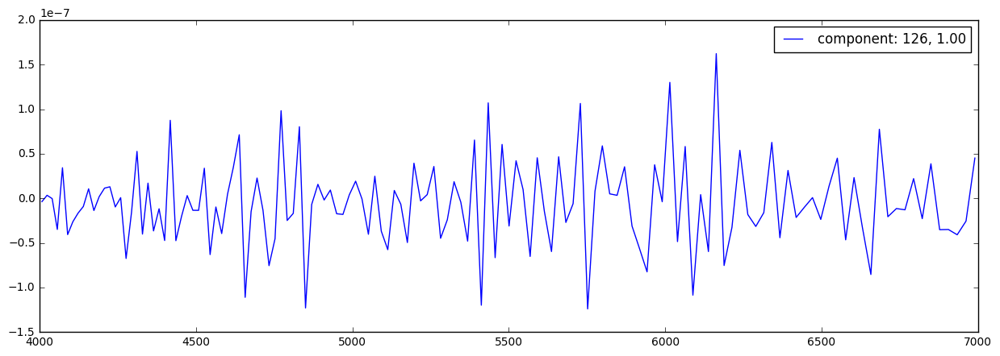

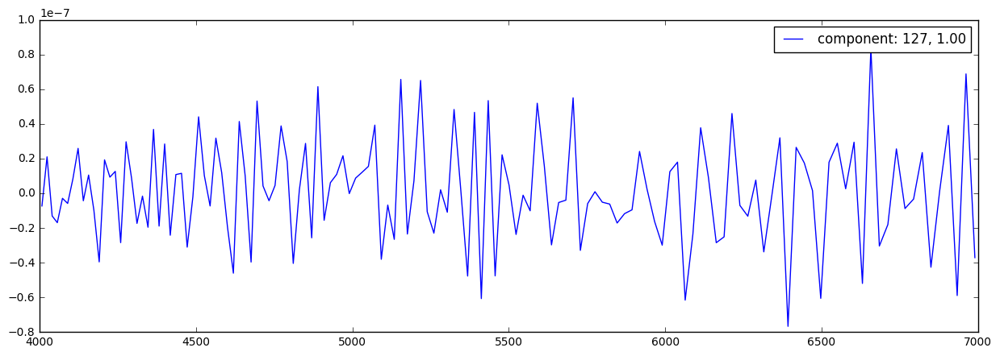

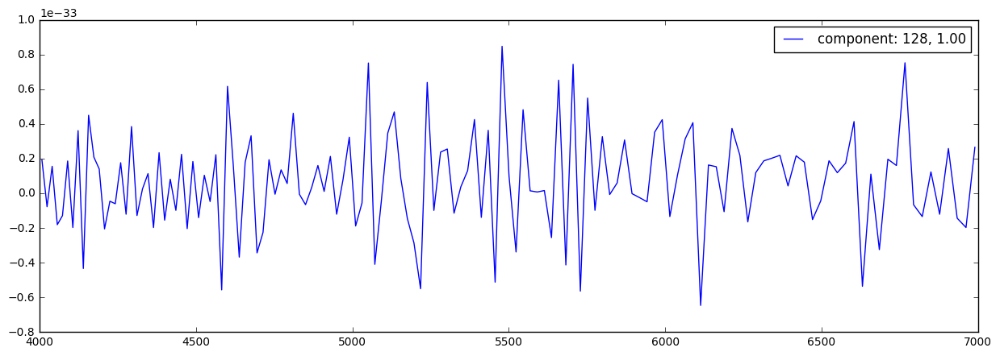

In [168]:
for i,ev in enumerate(evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,evals[i]*(ev), label="component: %d, %.2f"%(i,evals_cs[i]))
    plt.legend(fontsize=12)

## Recreate Spectra from PCA

[0, 4, 8, 20, 129]
(129, 138)
(138,)


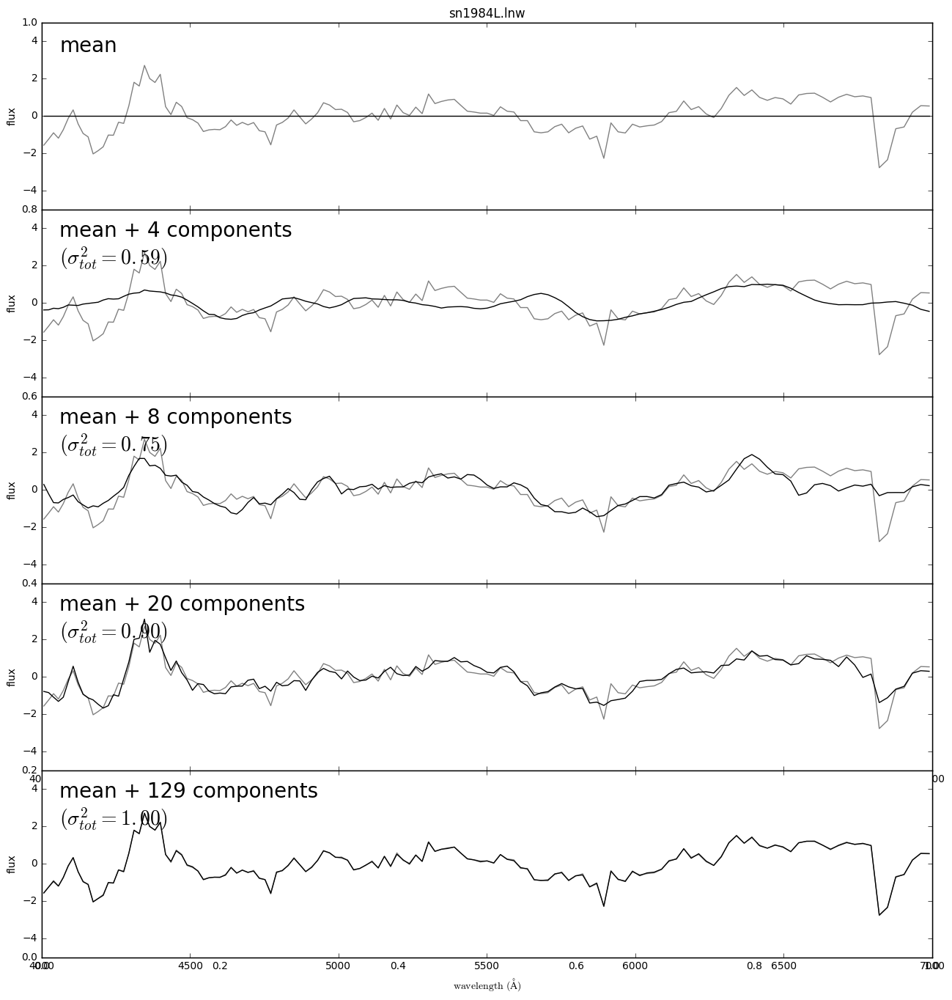

In [169]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_pca_components = [0,4,8,20,n_evecs]
print n_pca_components

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = spectra_matrix[spec]
    
    print evecs.shape
    print spectra_matrix[spec].shape
    pca_coeff = np.dot(evecs, spectra_matrix[spec])
    
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (np.dot(pca_coeff[:n], evecs[:n])), '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

# 2D PCA Component Marginalizations

In [170]:
print spectra_matrix.shape
print evecs.shape

(129, 138)
(129, 138)


In [171]:
spectra_pca_matrix = np.dot(evecs, spectra_matrix.T).T

In [120]:

spectra_pca_matrix = np.ndarray(spectra_matrix.shape)



print spectra_pca_matrix.shape
for j,spec in enumerate(spectra_matrix):
    pca_coeff = np.dot(evecs, spec)
    spectra_pca_matrix[j] = pca_coeff

(131, 46)


In [172]:
colors = ['c' if el==2 else 'r' for el in SN_type_vec]

(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)
(x,y) shape is (129,129)


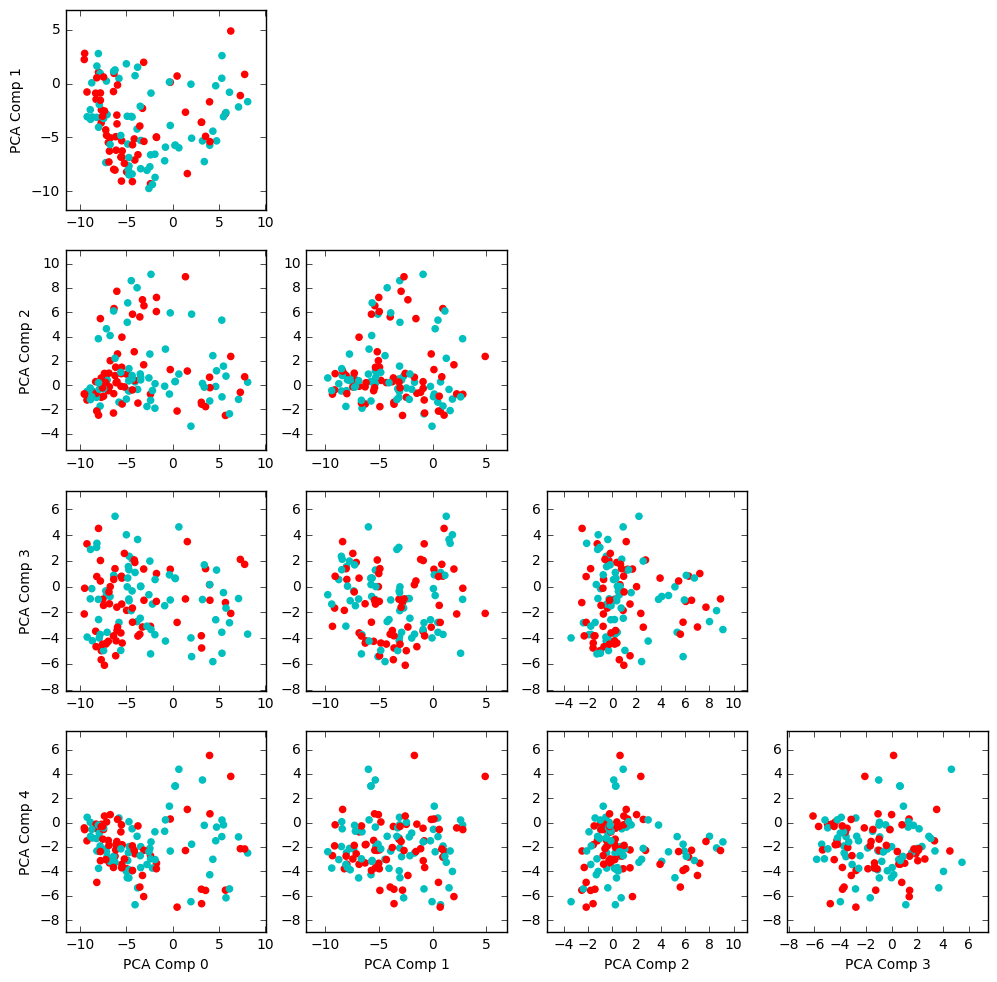

In [176]:
ncomp = 5
plt.figure(j, figsize=(15, 15))
for i in range(ncomp):
    for j in range(ncomp):
        if i > j:
            plot_number = ncomp*i+j+1
            plt.subplot(ncomp,ncomp,plot_number)
            x = spectra_pca_matrix[:,i]
            y = spectra_pca_matrix[:,j]
            print "(x,y) shape is (%d,%d)"%(len(x),len(y))
            plt.scatter(y,x,color=colors)
            plt.xlim((np.min(spectra_pca_matrix[:,j])-2,np.max(spectra_pca_matrix[:,j])+2))
            plt.ylim((np.min(spectra_pca_matrix[:,i])-2,np.max(spectra_pca_matrix[:,i])+2))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('PCA Comp %d'%(i))
            if i==4:
                plt.xlabel('PCA Comp %d'%(j))

In [177]:
spectra_pca_matrix.shape

(129, 129)

## Kernel PCA

In [17]:
from sklearn.decomposition import KernelPCA

In [72]:
spectra_matrix
n_comp = 50

In [73]:
kpca = KernelPCA(kernel='rbf', fit_inverse_transform=True, n_components=n_comp)
k_dat = kpca.fit_transform(spectra_matrix)

In [75]:
kevecs = kpca.alphas_[0:n_comp]
kevals = kpca.lambdas_[0:n_comp]/np.sum(kpca.lambdas_)
kevals_cs = kevals.cumsum()



In [76]:
k_back_evecs = kpca.inverse_transform(kevecs)

In [77]:
k_back_evecs.shape

(50, 414)

In [78]:
print kevals_cs[10:20]
print evals_cs[10:20]

[ 0.5769039   0.59465683  0.61072274  0.62639106  0.64095084  0.6549047
  0.66833485  0.68161102  0.69465331  0.70738347]
[ 0.76518044  0.779341    0.79194409  0.80260677  0.81206388  0.82138326
  0.83023832  0.83810981  0.84531566  0.85226031]


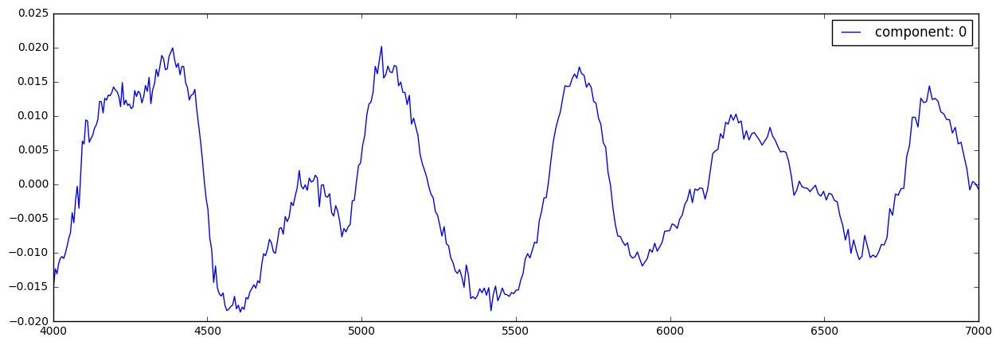

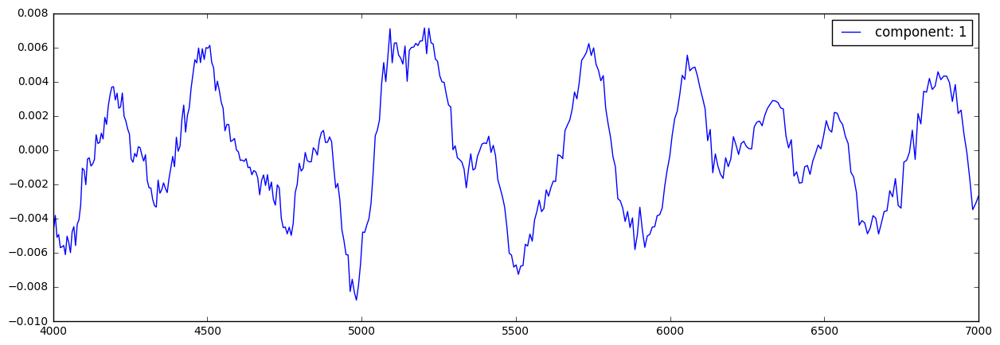

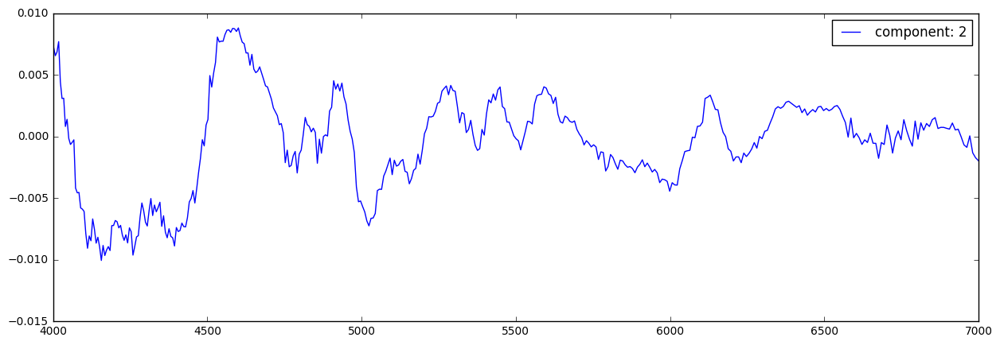

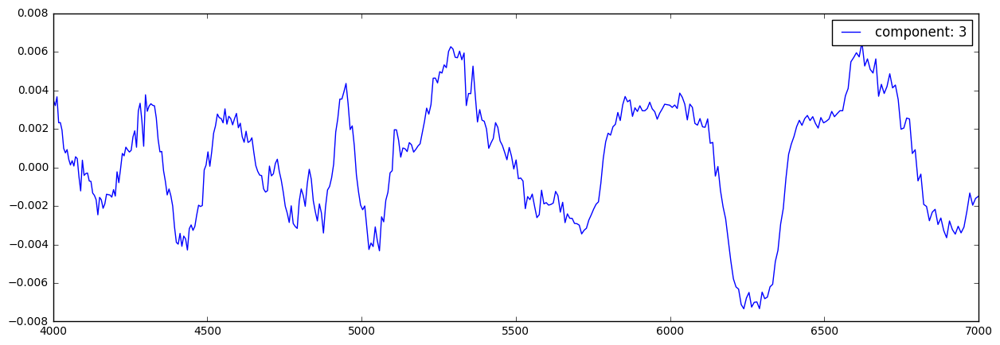

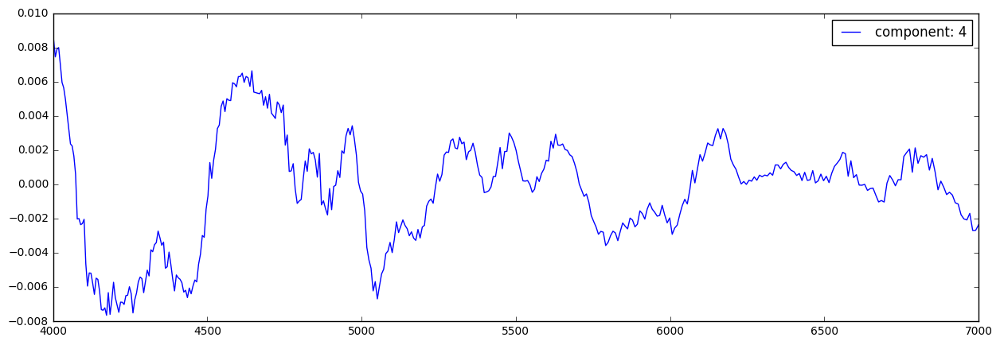

...

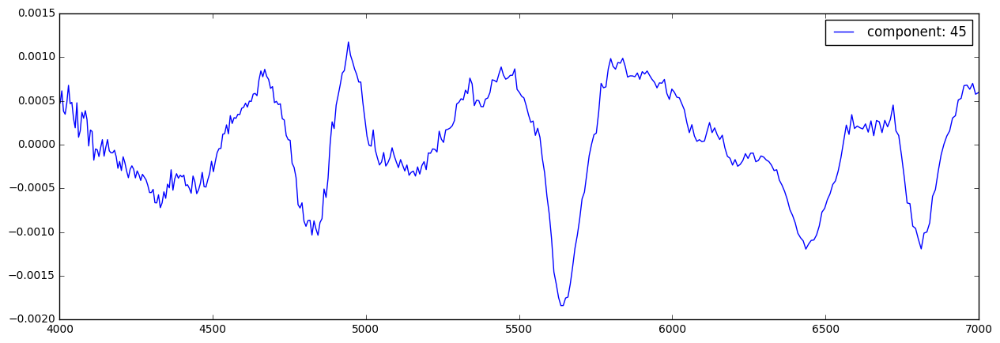

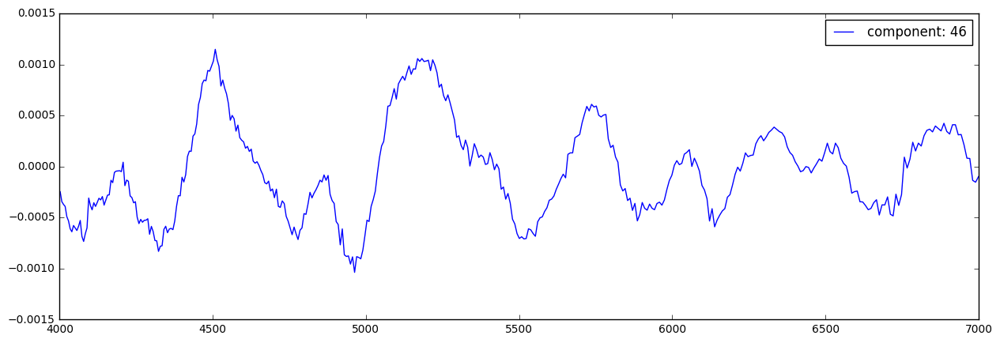

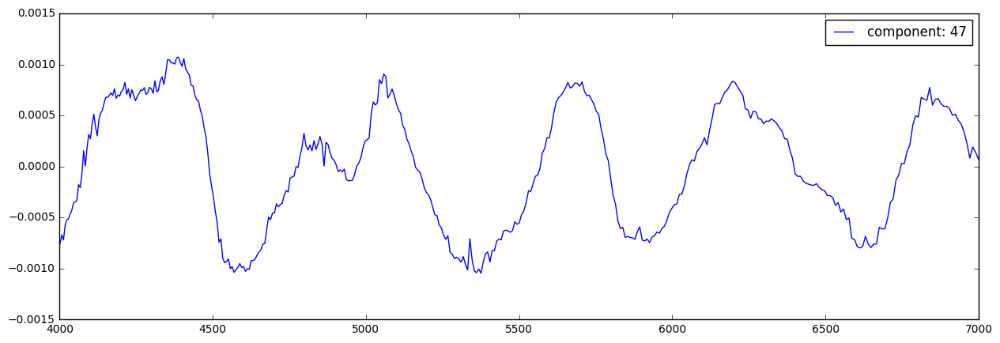

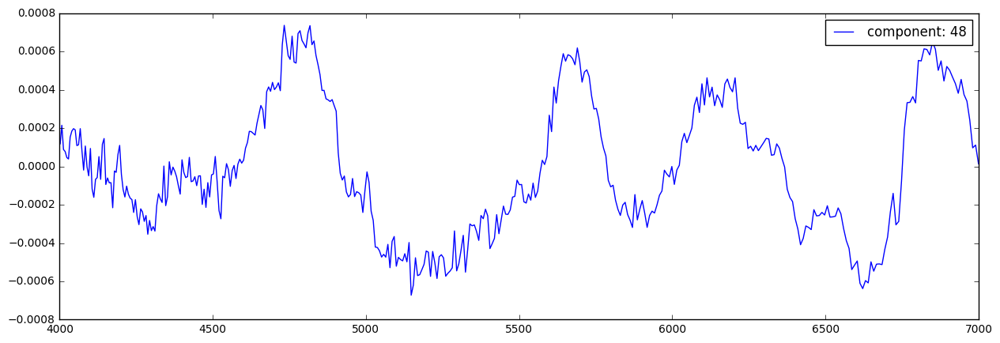

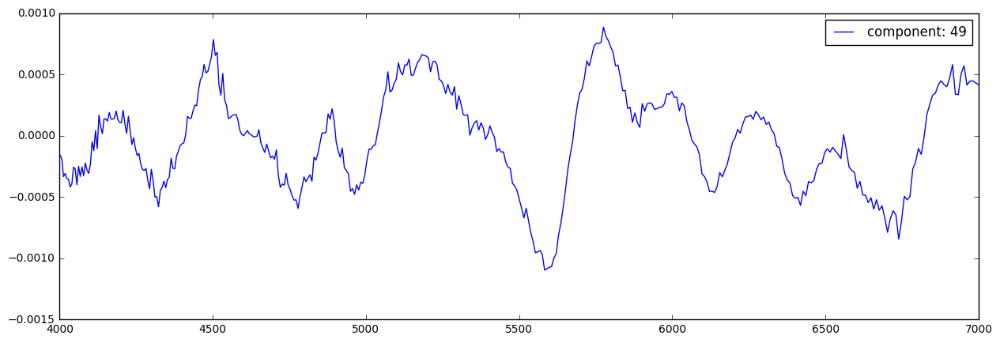

In [79]:
for i,kev in enumerate(k_back_evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,kevals[i]*(kev), label="component: %d"%i)
    plt.legend(fontsize=12)

In [54]:
spectra_pca_matrix.shape

(152, 46)

## Reconstruct Spectra using KPCA

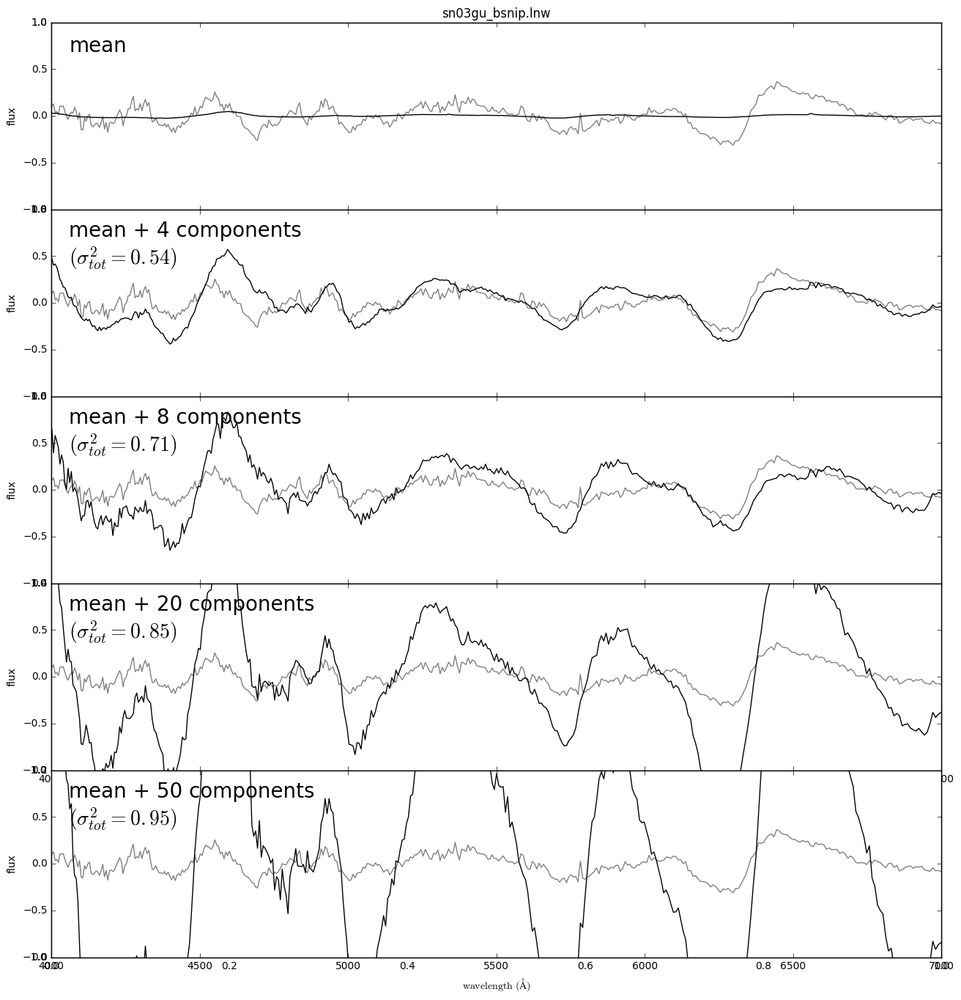

In [80]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_pca_components = [0,4,8,20,n_comp]

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = (spectra_matrix[spec] + spectra_mean)*spectra_std
    
    pca_coeff = np.dot(k_back_evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (spectra_mean + np.dot(pca_coeff[:n], k_back_evecs[:n]))*spectra_std, '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-1, 1)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')